# Post-scVI analysis of donor P13 data: SN+multiome; all trophoblast states; cleanup v4 (after v3 in S5-3)

After CCG and doublets removal (both by genotype and GEX)

This the version of the manifold after running scVI by `sample`

11.2021

What happens here:
- load preprocessed object (raw filtered counts)
- do normalising & log transforming
- save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- calculate neighborhood graph on the latent dimensionality reporesentation from scVI
- umap
- unbiased clustering
- save

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'

import numpy as np
import pandas as pd
import seaborn as sns
import scanpy as sc
from glob import iglob
import anndata
import bbknn
import scrublet as scr
import os
import sklearn
from sklearn.linear_model import LogisticRegression
import matplotlib as mpl
import scipy
import matplotlib.pyplot as plt
import pickle

In [2]:
np.random.seed(0)

In [3]:
sc.settings.verbosity = 3  # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.logging.print_versions()
sc.settings.set_figure_params(dpi=80)  # low dpi (dots per inch) yields small inline figures

-----
anndata     0.7.5
scanpy      1.7.1
sinfo       0.3.1
-----
PIL                 8.1.2
anndata             0.7.5
annoy               NA
anyio               NA
attr                20.3.0
babel               2.9.0
backcall            0.2.0
bbknn               NA
brotli              NA
cairo               1.20.0
certifi             2020.12.05
cffi                1.14.5
chardet             4.0.0
cloudpickle         1.6.0
colorama            0.4.4
cycler              0.10.0
cython_runtime      NA
cytoolz             0.11.0
dask                2021.03.1
dateutil            2.8.1
decorator           4.4.2
fsspec              0.8.7
get_version         2.1
google              NA
h5py                3.1.0
idna                2.10
igraph              0.8.3
ipykernel           5.5.0
ipython_genutils    0.2.0
ipywidgets          7.6.3
jedi                0.18.0
jinja2              2.11.3
joblib              1.0.1
json5               NA
jsonschema          3.2.0
jupyter_server      1.4.1
jupyte

In [4]:
save_path = '/lustre/scratch117/cellgen/team292/aa22/adata_objects/202007_snRNA-seq_MFI/snRNA_seq_MFI_202007_adatas/202012_FINAL_reanalysis_with_souporcell_deconvolution_common_variants/donor_P13_all_samples_analysis_202110/'

## Reading the preprocessed object

Preprocessing happened in S0 notebook

In [5]:
# reading the raw filtered object from joint analysis
adata = sc.read(save_path + 'adata_raw_filtered.h5ad')

In [6]:
# reading IDs of final cells to keep after doublet exclusion (scrublet and souporcell)
nodoublet_nulcei_IDs = pd.read_csv(save_path + 'obs_table_nodoublets.csv', index_col=0)
nodoublet_nulcei_IDs

,n_genes,donor,tissue_block,age,sample,percent_mito,n_counts,dataset,technique,scrublet_score,...,barcode,souporcell_assignment,inter_ind_doublet,S_score,G2M_score,phase,annotation_prev,louvain,is_doublet_propagate,origin_M_F
barcode_sample,,,,,,,,,,,,,,,,,,,,,
AAACCCAAGATACATG-1_WSSS_PLA8764121,1253,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000000,1820.0,snRNA-seq,10X,0.191617,...,AAACCCAAGATACATG-1_WSSS_PLA8764121,WSSS_PLA8764121_0,0,0.053412,0.056947,G2M,0_none,16,0,F
AAACCCACAAATCCCA-1_WSSS_PLA8764121,1279,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000535,1868.0,snRNA-seq,10X,0.032895,...,AAACCCACAAATCCCA-1_WSSS_PLA8764121,WSSS_PLA8764121_1,0,-0.120729,-0.113529,G1,dM2,10,0,M
AAACCCACAACTGTGT-1_WSSS_PLA8764121,473,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000000,556.0,snRNA-seq,10X,0.091892,...,AAACCCACAACTGTGT-1_WSSS_PLA8764121,WSSS_PLA8764121_1,0,0.042173,-0.027934,S,0_none,14,0,M
AAACCCACAAGCTGCC-1_WSSS_PLA8764121,1360,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000473,2116.0,snRNA-seq,10X,0.012335,...,AAACCCACAAGCTGCC-1_WSSS_PLA8764121,WSSS_PLA8764121_1,0,-0.121624,0.050396,G2M,dNK1,14,0,M
AAACCCACATAACCCA-1_WSSS_PLA8764121,1891,P13,PU8-9_B5,8-9_PCW,WSSS_PLA8764121,0.000305,3274.0,snRNA-seq,10X,0.073634,...,AAACCCACATAACCCA-1_WSSS_PLA8764121,WSSS_PLA8764121_1,0,-0.125064,-0.066023,G1,dS1,8,0,M
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTGTTCGTCAAGT-1_Pla_Camb10714920_and_40110_Pla_Camb10687916,2409,P13,unknown,8-9_PCW,Pla_Camb10714920_and_40110_Pla_Camb10687916,0.007270,5227.0,snRNA-seq,10X,0.013699,...,TTTGTGTTCGTCAAGT-1_Pla_Camb10714920_and_40110_...,Pla_Camb10714920_and_40110_Pla_Camb10687916_0,0,0.033632,-0.079893,S,0_none,7,0,M
TTTGTGTTCTTAGTCT-1_Pla_Camb10714920_and_40110_Pla_Camb10687916,4129,P13,unknown,8-9_PCW,Pla_Camb10714920_and_40110_Pla_Camb10687916,0.002532,17379.0,snRNA-seq,10X,0.102190,...,TTTGTGTTCTTAGTCT-1_Pla_Camb10714920_and_40110_...,Pla_Camb10714920_and_40110_Pla_Camb10687916_1,0,-0.059688,-0.098701,G1,0_none,2,0,F
TTTGTTGGTCACAGCG-1_Pla_Camb10714920_and_40110_Pla_Camb10687916,3116,P13,unknown,8-9_PCW,Pla_Camb10714920_and_40110_Pla_Camb10687916,0.004499,7779.0,snRNA-seq,10X,0.036876,...,TTTGTTGGTCACAGCG-1_Pla_Camb10714920_and_40110_...,Pla_Camb10714920_and_40110_Pla_Camb10687916_1,0,0.066281,-0.038885,S,0_none,30,0,F


In [7]:
# subsetting the adata object to final cells
adata = adata[list(nodoublet_nulcei_IDs.index), :].copy()
adata

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


AnnData object with n_obs × n_vars = 74244 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

In [8]:
np.unique(adata.obs['sample'])

array(['Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
      dtype=object)

In [9]:
# adding metadata
for col in nodoublet_nulcei_IDs.columns:
    print(col)
    adata.obs[col] = nodoublet_nulcei_IDs.loc[adata.obs_names,col]

n_genes
donor
tissue_block
age
sample
percent_mito
n_counts
dataset
technique
scrublet_score
scrublet_cluster_score
bh_pval
batch
is_doublet
barcode_sample_copy
barcode
souporcell_assignment
inter_ind_doublet
S_score
G2M_score
phase
annotation_prev
louvain
is_doublet_propagate
origin_M_F


In [10]:
np.unique(adata.obs['sample'])

array(['Pla_Camb10691970', 'Pla_Camb10691971',
       'Pla_Camb10714919_and_40110_Pla_Camb10687915',
       'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
      dtype=object)

In [11]:
adata.obs['annotation_prev_or_removed'] = adata.obs['annotation_prev']

adata.obs['annotation_prev_or_removed'] = ['removed' if (value == '0_none' and sample in ['WSSS_PLA8764121',
       'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751']) else value for value,sample in zip(adata.obs['annotation_prev'], adata.obs['sample'])]

In [12]:
np.unique(adata.obs['annotation_prev_or_removed'])

array(['0_none', 'DC1', 'EVT_1', 'EVT_2', 'EVT_3', 'Endo_F', 'Endo_L',
       'Endo_M', 'GC', 'HOFB', 'SCT', 'VCT', 'VCT_CCC', 'VCT_fusing',
       'VCT_p', 'dEpi_secretory', 'dM2', 'dNK1', 'dNK3', 'dPV1', 'dS1',
       'dS3', 'eEVT', 'fF', 'fPV', 'iEVT', 'removed', 'uSMC'],
      dtype=object)

In [13]:
# quick check to see if raw is raw or not
expr_mtx_dense = adata[adata.obs['sample'] == 'Pla_Camb10691970'].X.todense()

In [14]:
# YAS we all good
np.unique(expr_mtx_dense)

matrix([[   0.,    0.,    0., ..., 4162., 4637., 6366.]], dtype=float32)

In [16]:
# also subsetting to only trophoblast after cleanup v3 in S3-3 notebook
labels = pd.read_csv(save_path + 'obs_table_adata_scvi_SN_and_multiome_with_trophoblast_contaminant_v3_labels.csv', index_col=0)
troph_idx = labels[labels['cleanup_v3_contaminant'] == 'keeping'].index
adata = adata[troph_idx,:].copy()
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

________

Carrying on to 
- Normalise and log transform
- Save raw attribute to then be able to plot all genes on the HVG-subsetted dataset
- Make cell names (obs) and gene names (var) unique

In [17]:
# normalise and log transform
sc.pp.normalize_per_cell(adata, counts_per_cell_after=1e4)
sc.pp.log1p(adata)

# saving normalised and log transformed values into the raw attribute to later be able to plot
adata.raw = adata.copy()

adata.var_names_make_unique()
adata.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:02): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


_____________________________________________________________________________________________________________________________________________________________

In [18]:
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata.var_names]
g2m_genes = [x for x in g2m_genes if x in adata.var_names]
sc.tl.score_genes_cell_cycle(adata, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
    finished: added
    'S_score', score of gene set (adata.obs).
    503 total control genes are used. (0:00:01)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    503 total control genes are used. (0:00:01)
-->     'phase', cell cycle phase (adata.obs)


In [19]:
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p'

_______________________________________________________________________________________________________

# Read in scVI-calculated latent representation

In [45]:
# a few values
n_latent = [8,18
           ]

### 10.11.2021 run, correction by `sample`

In [46]:
latent_representations_donor = {}

# didn't align as well as corrected by donor_sample

for n_latent_value in n_latent:
    print(n_latent_value)
    
    curr_path = '/nfs/team292/aa22/scVI_related/202111_upd_in_vivo_analysis/results/20211110_obsm_with_scVI_latent_representation_n_' + str(n_latent_value) + '_after_CCG_removal_and_all_doublet_exclusion_by_sample_donor_P13_SN_and_multiome_trophoblast_cleanup_v3.csv' 
        
    latent_representations_donor[n_latent_value] = pd.read_csv(curr_path, index_col=0)

8
18


In [47]:
# assign these latent_representations into adata.obsm
for n_latent_value in n_latent:
    print(n_latent_value)
    adata.obsm['X_scVI_n_latent_' + str(n_latent_value) + '_sample'] = np.array(latent_representations_donor[n_latent_value])

8
18


In [48]:
adata.obsm['X_scVI_n_latent_8_sample'].shape

(39298, 8)

__________________________________________________________________________________________________________________________________________________________________

### Neighbourhood graph & UMAP

In [49]:
%%time

for n_latent_value in n_latent:
    print(n_latent_value)
    sc.pp.neighbors(adata, n_neighbors=10, use_rep='X_scVI_n_latent_' + str(n_latent_value) + '_sample',
               key_added='neighbors_scVI_n_latent_' + str(n_latent_value) + '_sample' )

computing neighbors


8


    finished: added to `.uns['neighbors_scVI_n_latent_8_sample']`
    `.obsp['neighbors_scVI_n_latent_8_sample_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_scVI_n_latent_8_sample_connectivities']`, weighted adjacency matrix (0:00:02)
computing neighbors


18


    finished: added to `.uns['neighbors_scVI_n_latent_18_sample']`
    `.obsp['neighbors_scVI_n_latent_18_sample_distances']`, distances for each pair of neighbors
    `.obsp['neighbors_scVI_n_latent_18_sample_connectivities']`, weighted adjacency matrix (0:00:03)


CPU times: user 13.2 s, sys: 24 s, total: 37.2 s
Wall time: 6.2 s


In [50]:
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sample', 'umap', 'donor_colors

__________________________________________________________________________________________________________________________________________________________________

In [51]:
%%time

for n_latent_value in n_latent:
    print(n_latent_value)

    sc.tl.umap(adata, random_state=0,
              neighbors_key='neighbors_scVI_n_latent_' + str(n_latent_value) + '_sample')
    # copy current adata.obsm['X_umap'] into adata.obsm['X_umap_scVI_n_latent_' + str(n_latent_value)]
    adata.obsm['X_umap_scVI_n_latent_' + str(n_latent_value) + '_sample'] = adata.obsm['X_umap']
    
    

computing UMAP


8


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:13)
computing UMAP


18


    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)


CPU times: user 46.3 s, sys: 22.2 s, total: 1min 8s
Wall time: 27.8 s


In [52]:
np.unique(adata.obs['sample'], return_counts=True)

(array(['Pla_Camb10691970', 'Pla_Camb10691971',
        'Pla_Camb10714919_and_40110_Pla_Camb10687915',
        'Pla_Camb10714920_and_40110_Pla_Camb10687916', 'WSSS_PLA8764121',
        'WSSS_PLA8764122', 'WSSS_PLA8810750', 'WSSS_PLA8810751'],
       dtype=object),
 array([4230, 4074, 3162, 3239, 3310, 3310, 9596, 8377]))

In [53]:
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sample', 'umap', 'donor_colors

## Saving this object with all the manifolds calculated

In [54]:
adata.write(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v4.h5ad')


In [5]:
# reading the previously saved file
adata = sc.read(save_path + 'adata_P13_scVI_analysed_corr_by_sample_SN_and_multiome_trophoblast_v4.h5ad')


In [55]:
palette_new = ['lightgrey', # none / new samples data
               '#d5e7f7',
                 '#d895ea',
                 '#9f6bac',
                 '#bf4cea',
                 '#b9a96b',
                 '#f8f4a8',
                 '#eacf68',
                 '#DBC7DE',
                 '#69b4ce',
                 '#eb5376',
                 '#ecdbe5',
                 '#e7a3c8',
                 '#b53279',
                 '#e96db3',
                 '#c35338',
                 '#66cef6',
                 '#deeab1',
                 '#2d563c',
                 '#6b6a6b',
                 '#c9bdb2',
                 '#eaa944',
                 '#FF1200',
                 '#a79388',
                 '#aeb1b7',
                 '#510058',
               'blue', # previously removed as soupy nuclei
                 '#f37a73']


### scVI-corrected by `sample`

n_latent = 8

In [56]:
curr_embedding_key = 'X_umap_scVI_n_latent_8_sample'

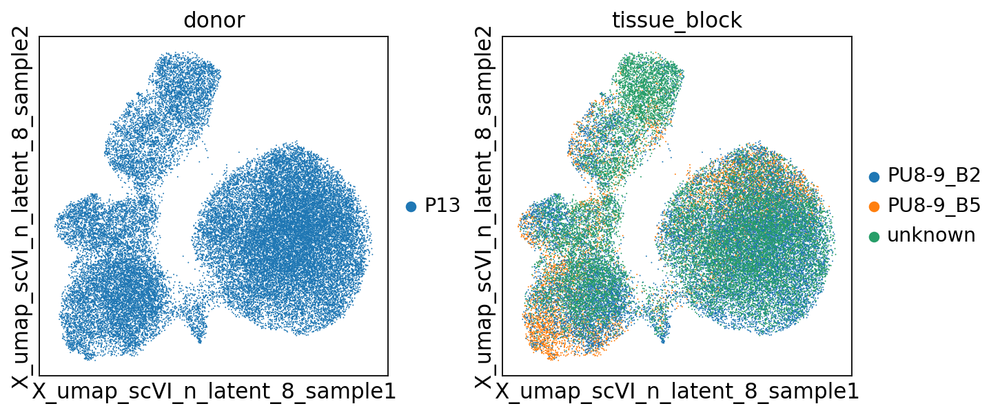

In [57]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['donor','tissue_block'])

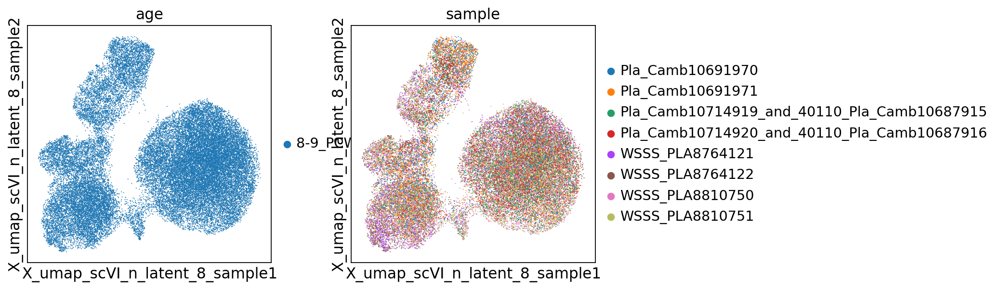

In [58]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['age','sample'])

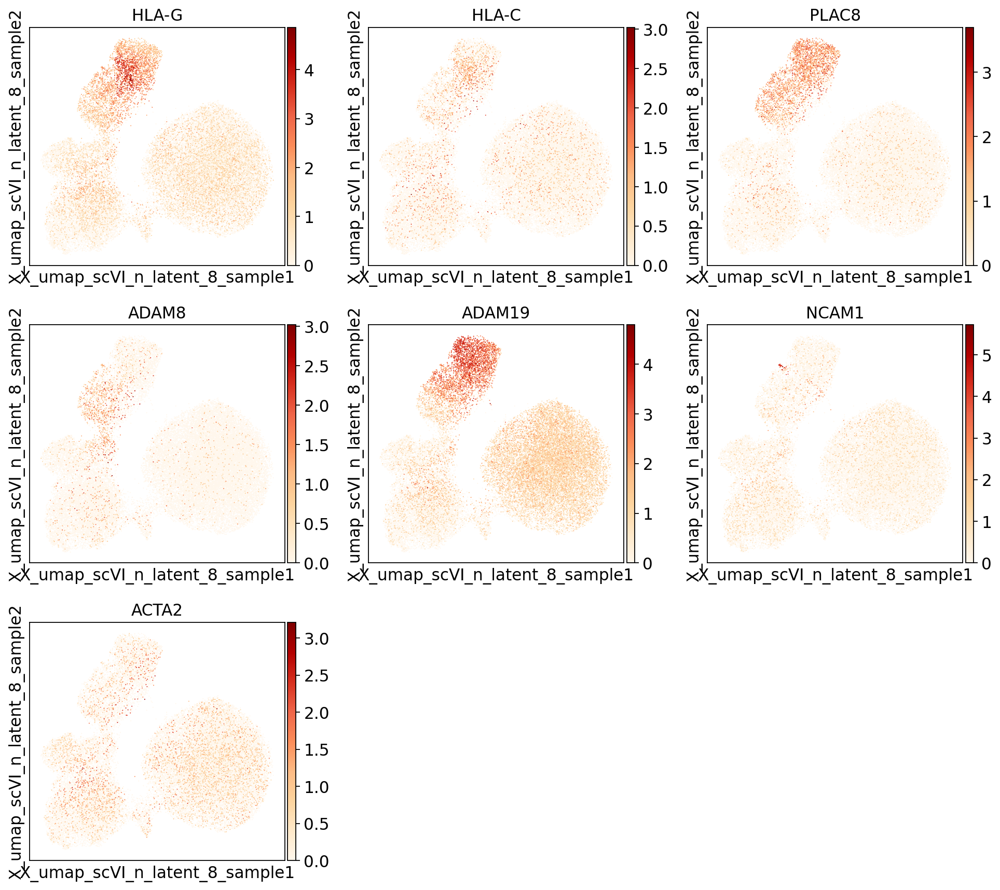

In [59]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['HLA-G','HLA-C','PLAC8',
                             'ADAM8','ADAM19',
                            'NCAM1','ACTA2'], ncols=3, use_raw=True, cmap='OrRd')

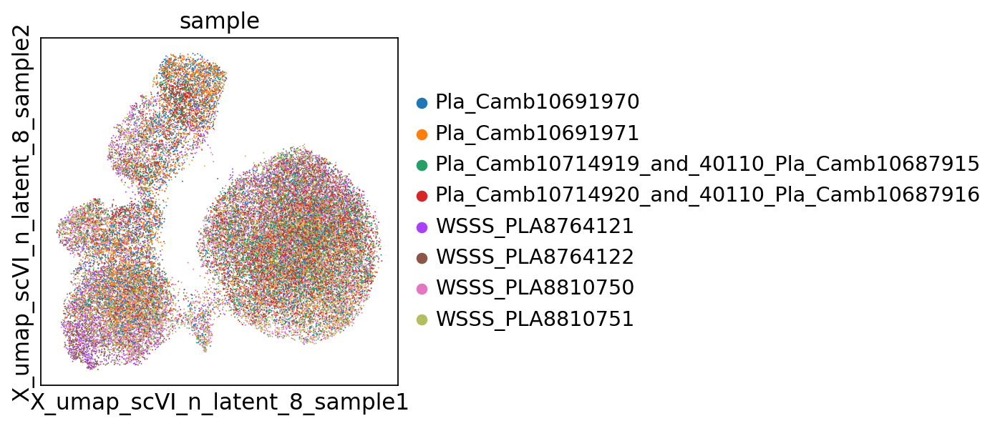

In [60]:
sc.pl.embedding(adata, curr_embedding_key, color=['sample'])

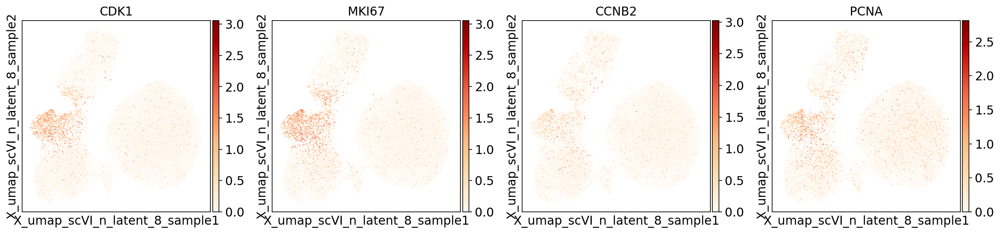

In [61]:
sc.pl.embedding(adata, curr_embedding_key, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [62]:
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sample', 'umap', 'donor_colors

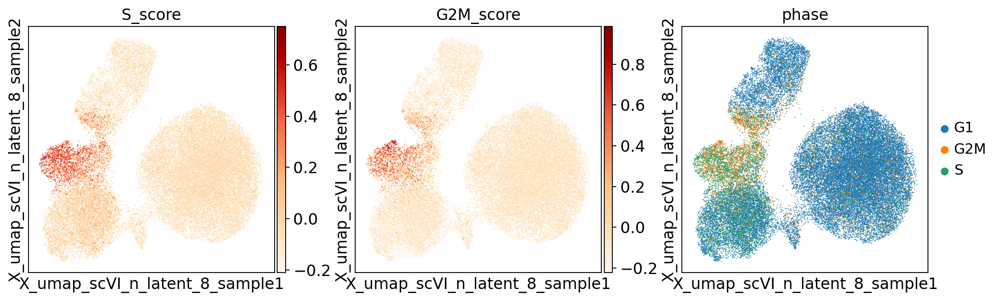

In [63]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['S_score','G2M_score','phase'], cmap='OrRd')

In [64]:
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sample', 'umap', 'donor_colors

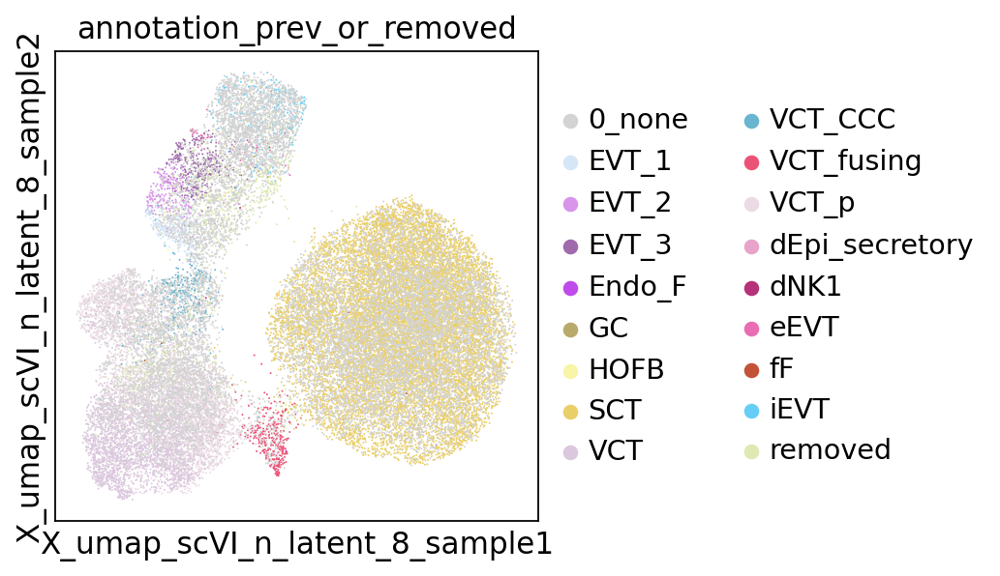

In [65]:
sc.pl.embedding(adata, curr_embedding_key, color=['annotation_prev_or_removed'], palette=palette_new)

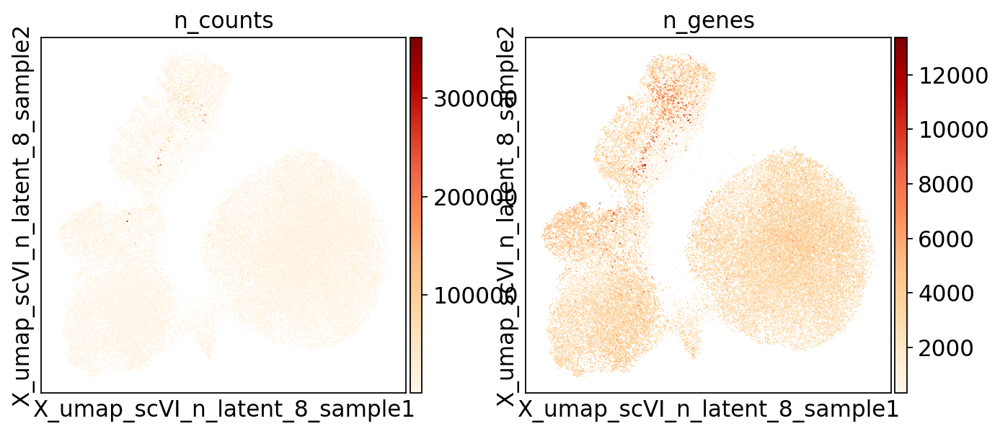

In [66]:
sc.pl.embedding(adata, curr_embedding_key, color=['n_counts',
                             'n_genes'], cmap='OrRd')

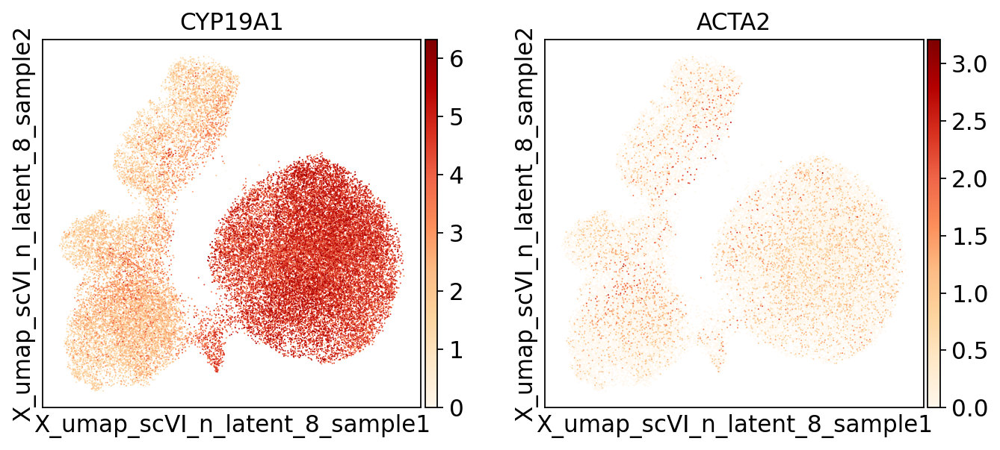

In [67]:
sc.pl.embedding(adata, curr_embedding_key, color=['CYP19A1','ACTA2'], cmap='OrRd', use_raw=True)

### scVI-corrected by `sample`

n_latent = 18

In [68]:
curr_embedding_key = 'X_umap_scVI_n_latent_18_sample'

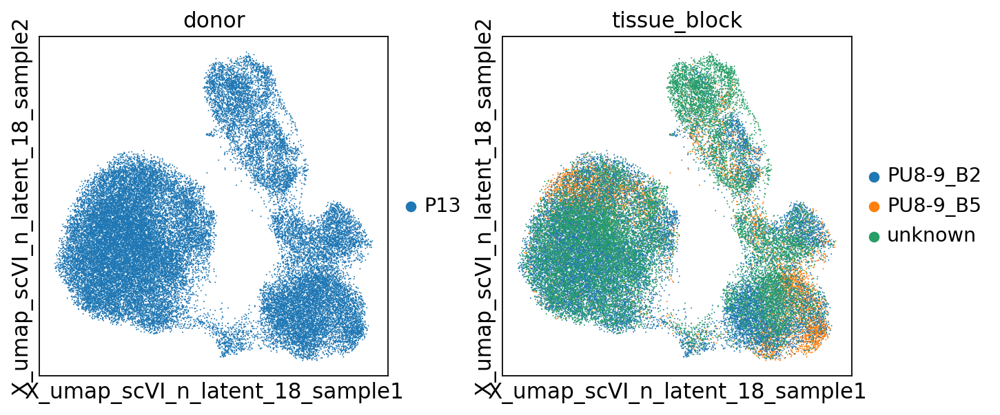

In [69]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['donor','tissue_block'])

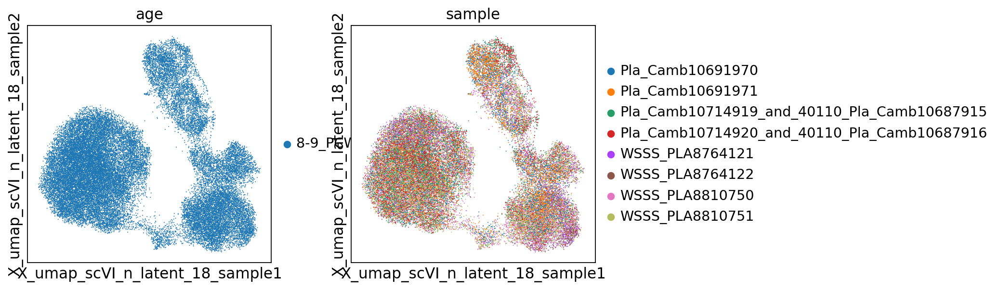

In [70]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['age','sample'])

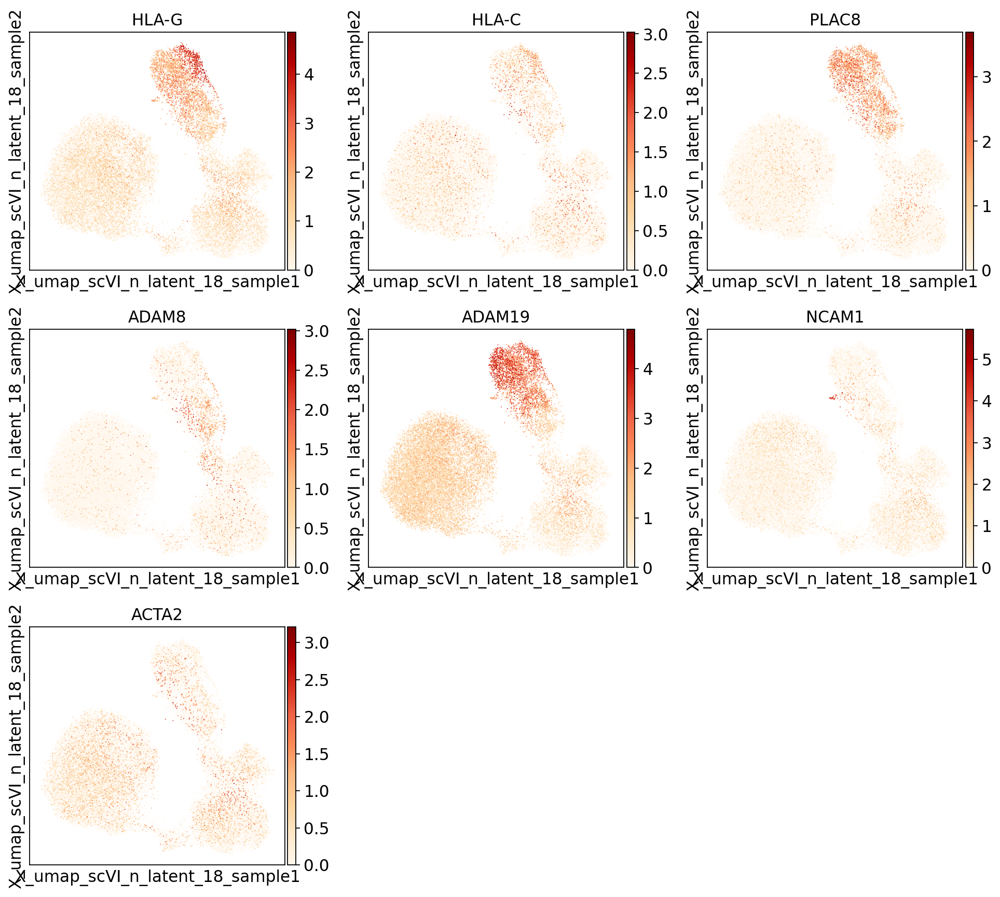

In [71]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['HLA-G','HLA-C','PLAC8',
                             'ADAM8','ADAM19',
                            'NCAM1','ACTA2'], ncols=3, use_raw=True, cmap='OrRd')

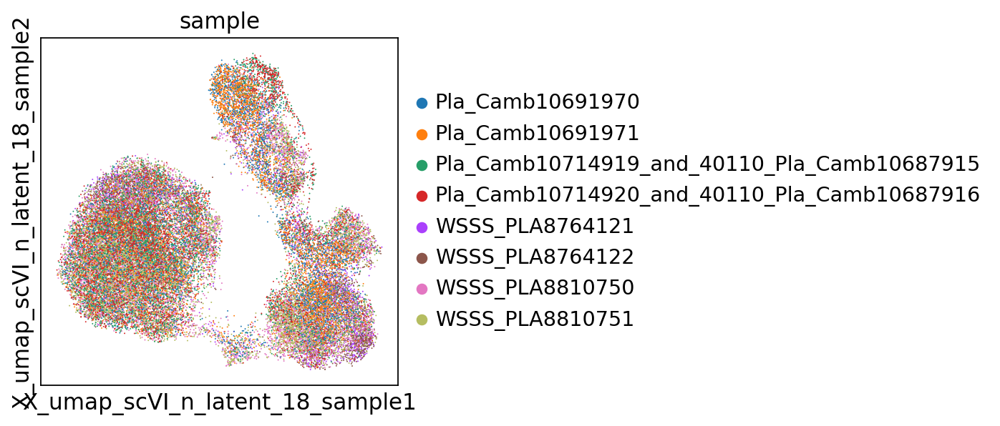

In [72]:
sc.pl.embedding(adata, curr_embedding_key, color=['sample'])

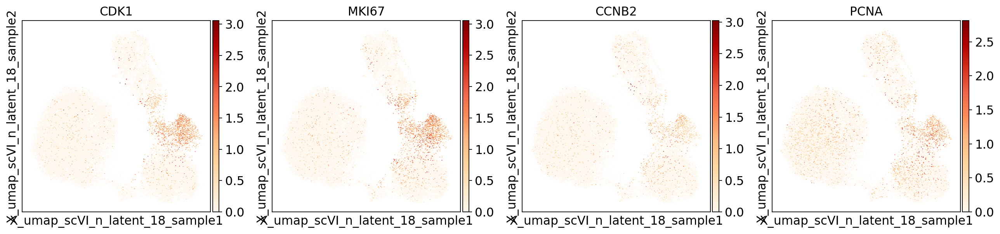

In [73]:
sc.pl.embedding(adata, curr_embedding_key, color=['CDK1','MKI67','CCNB2','PCNA'], cmap='OrRd')

In [74]:
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sample', 'umap', 'donor_colors

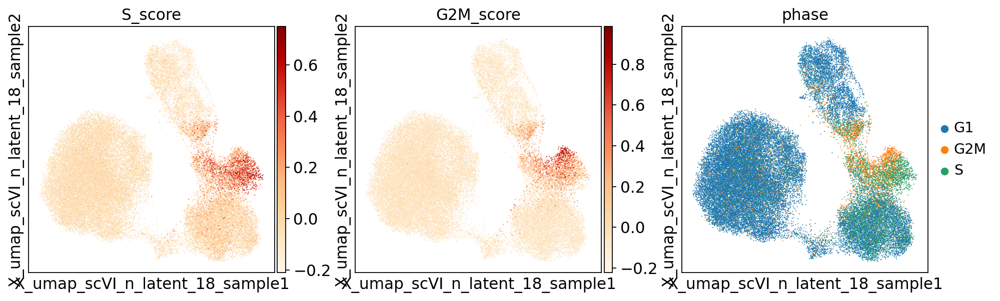

In [75]:
sc.pl.embedding(adata, curr_embedding_key,
                color=['S_score','G2M_score','phase'], cmap='OrRd')

In [76]:
adata

AnnData object with n_obs × n_vars = 39298 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'barcode_sample_copy', 'barcode', 'souporcell_assignment', 'inter_ind_doublet', 'S_score', 'G2M_score', 'phase', 'annotation_prev', 'louvain', 'is_doublet_propagate', 'origin_M_F', 'annotation_prev_or_removed'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'neighbors_scVI_n_latent_8_sample', 'umap', 'donor_colors

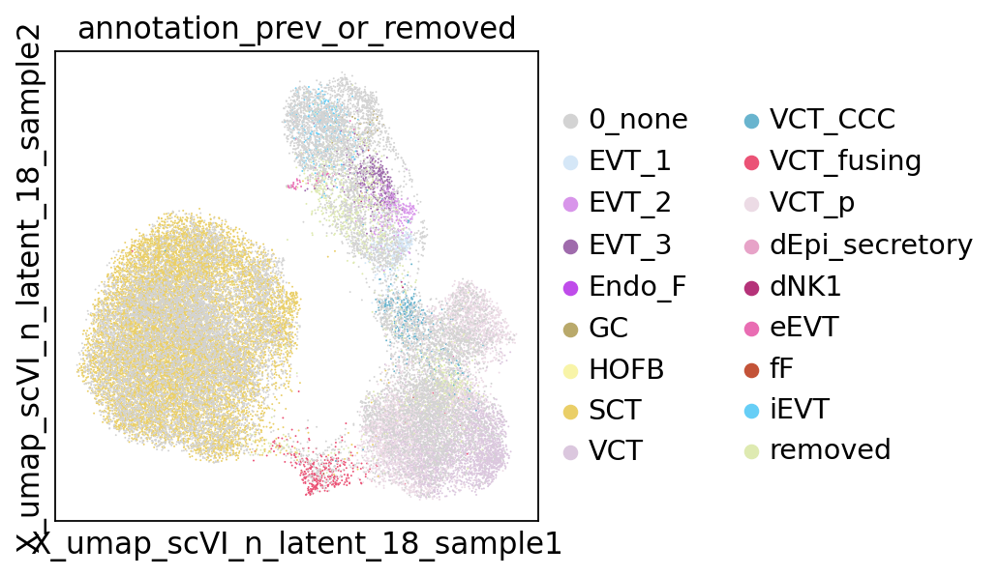

In [77]:
sc.pl.embedding(adata, curr_embedding_key, color=['annotation_prev_or_removed'], palette=palette_new)

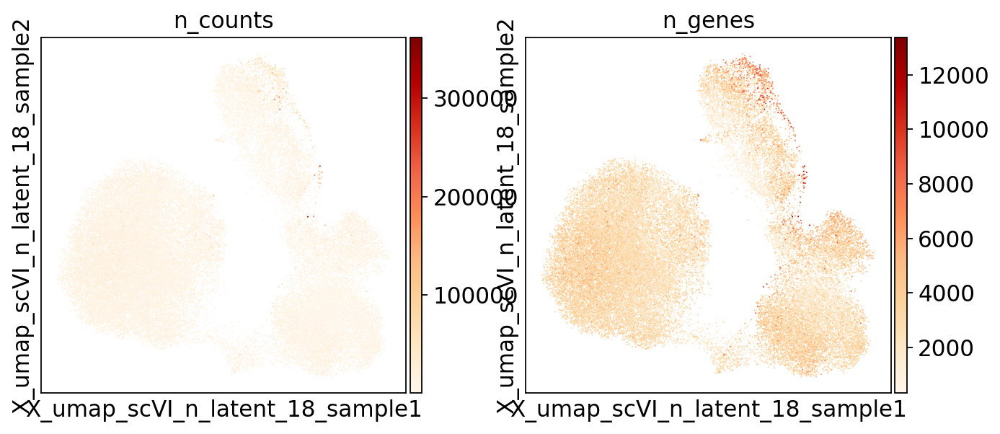

In [78]:
sc.pl.embedding(adata, curr_embedding_key, color=['n_counts',
                             'n_genes'], cmap='OrRd')

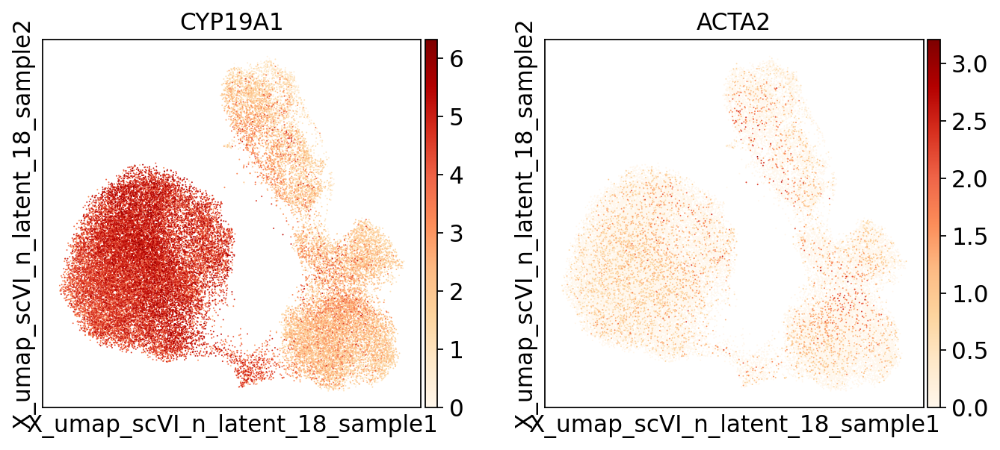

In [79]:
sc.pl.embedding(adata, curr_embedding_key, color=['CYP19A1','ACTA2'], cmap='OrRd', use_raw=True)

In [80]:
# using object with 8 latent variables here
curr_embedding_key = 'X_umap_scVI_n_latent_8_sample'

In [81]:
# cluster apart invading troph from VCT_CCC onwards
sc.tl.louvain(adata, resolution=1.0,
             neighbors_key = 'neighbors_scVI_n_latent_8_sample',
             key_added = 'louvain_scvi_n_latent_8')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 16 clusters and added
    'louvain_scvi_n_latent_8', the cluster labels (adata.obs, categorical) (0:00:02)


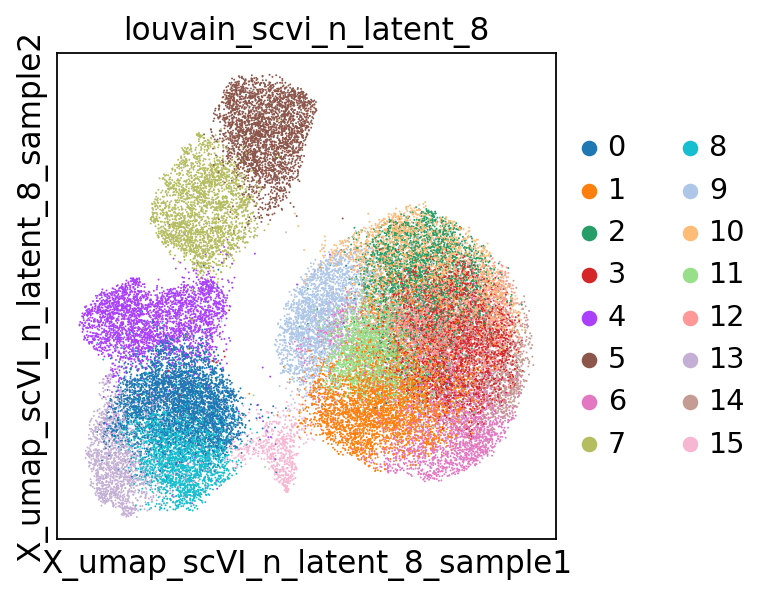

In [82]:
sc.pl.embedding(adata, curr_embedding_key, color='louvain_scvi_n_latent_8')

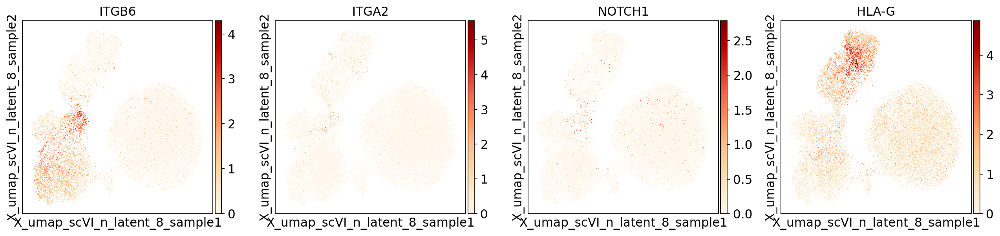

In [84]:
# where are VCT_CCC?
sc.pl.embedding(adata, curr_embedding_key, color=['ITGB6','ITGA2','NOTCH1','HLA-G'], cmap='OrRd')

In [87]:
# cluster apart invading troph from VCT_CCC onwards
sc.tl.louvain(adata, resolution=0.1,
             neighbors_key = 'neighbors_scVI_n_latent_8_sample',
              restrict_to=('louvain_scvi_n_latent_8',['4']),
             key_added = 'louvain_scvi_n_latent_8_R')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 17 clusters and added
    'louvain_scvi_n_latent_8_R', the cluster labels (adata.obs, categorical) (0:00:00)


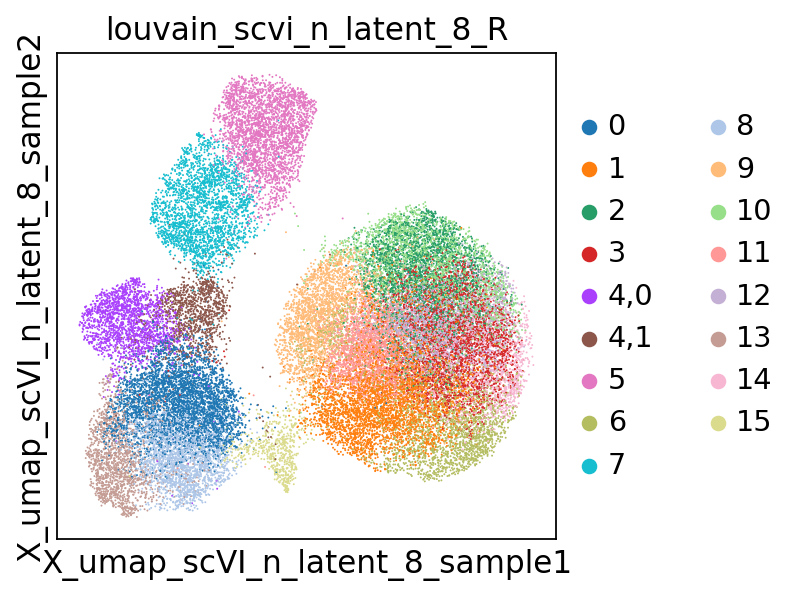

In [88]:
sc.pl.embedding(adata, curr_embedding_key, color='louvain_scvi_n_latent_8_R')

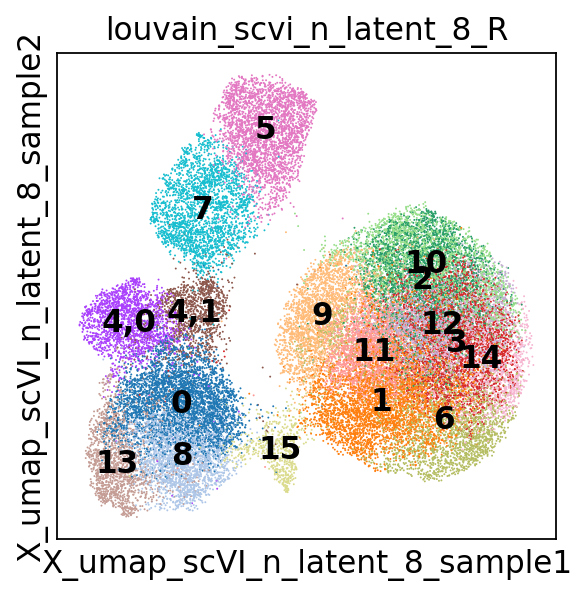

In [89]:
sc.pl.embedding(adata, curr_embedding_key, color='louvain_scvi_n_latent_8_R', legend_loc='on data')

# clusters 4,1; 5 and 7 are invading troph  --> going save labels and prepare to rerun scVI (calculate cc-assoc genes and optimal n_PCs)

In [90]:
# add 'trophoblast' or 'rest' labels
adata.obs['inv_troph_labels'] = ['inv_troph' if clus in ['4,1','5','7'] else 'others' for clus in adata.obs['louvain_scvi_n_latent_8_R']]

In [91]:
# save these labels 
adata.obs.to_csv(save_path + 'obs_table_adata_scvi_SN_and_multiome_with_inv_troph_labels_S3-4_notebook.csv')

# Preparation for scVI: 

1) Calculating cell cycle-associated genes (to later be excluded in scVI analysis)
2) Calculating a minimum extimate of number of latent variables to use in scVI analysis later (when doing batch correction) as the number of PCs optimally explaining this data

for a suset of data corresponding to only trophoblast (according to selection done above)

Let's see if cell cycle has an effect in trophoblast and remember them to exclude in scVI calculation

In [92]:
adata = sc.read(save_path + 'adata_raw_filtered.h5ad')

obs_table_with_louvain = pd.read_csv(save_path + 'obs_table_adata_scvi_SN_and_multiome_with_inv_troph_labels_S3-4_notebook.csv', index_col=0)

adata.obs['inv_troph_labels'] = obs_table_with_louvain.loc[list(set(adata.obs_names) & set(obs_table_with_louvain.index)), 'inv_troph_labels']
adata = adata[adata.obs['inv_troph_labels'] == 'inv_troph'].copy()

adata_copy = adata.copy()

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [93]:
adata_copy

AnnData object with n_obs × n_vars = 6338 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'inv_troph_labels'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'

In [94]:
# normalise and log transform
sc.pp.normalize_per_cell(adata_copy, counts_per_cell_after=1e4)
sc.pp.log1p(adata_copy)

# saving the raw attribute
adata_copy.raw = adata_copy.copy()

adata_copy.var_names_make_unique()
adata_copy.obs_names_make_unique()

normalizing by total count per cell
    finished (0:00:00): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


### Filter Cell cycle genes

### SN + multiome, invading trophoblast states manifold

Per genes analysis: identify genes behaving like known cell cycle genes


In [95]:
cellcycle_adata = adata_copy.copy()
# Extract highly variable genes
#filter_result = sc.pp.filter_genes_dispersion(
#    cellcycle_adata.X, min_mean=0.0125, max_mean=3, min_disp=0.5)
#sc.pl.filter_genes_dispersion(filter_result,save='_ccg_identification.pdf')

In [96]:
# Traspose matrix for a GENE-centered analysis
cellcycle_adata = cellcycle_adata.T
#cellcycle_adata = cellcycle_adata[filter_result.gene_subset,:]


In [97]:
# Scale data to unit variance and zero mean
sc.pp.scale(cellcycle_adata, max_value=10)
# Scatter plot in PCA coordinates
sc.tl.pca(cellcycle_adata)

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:00:13)


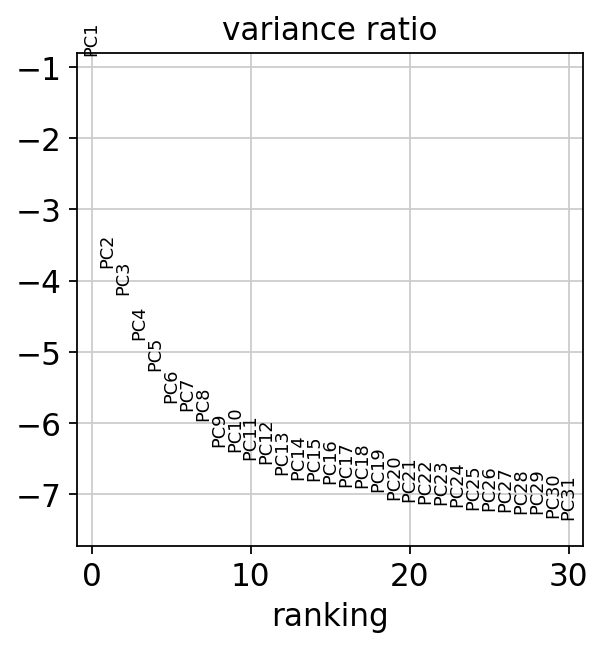

In [98]:
# Plot the variance ratio
sc.pl.pca_variance_ratio(cellcycle_adata, log=True, save='_ccg_identification.pdf')

computing neighbors
    using 'X_pca' with n_pcs = 9
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:03)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:14)
... storing 'inv_troph_labels' as categorical


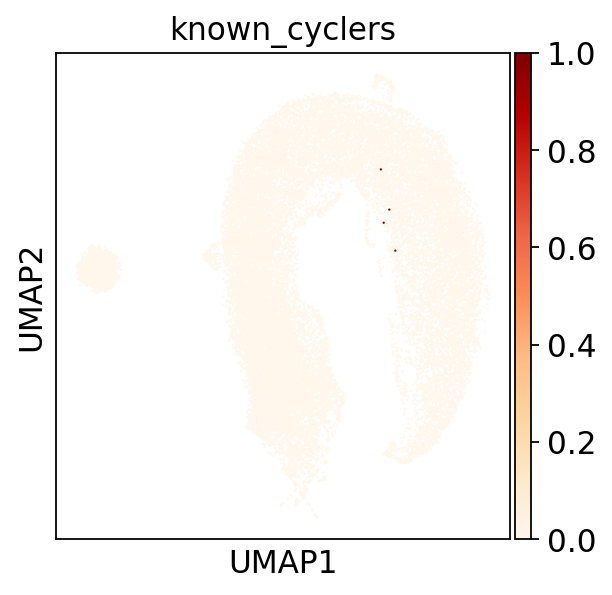

In [99]:
# Identify genes behaving like cc genes
num_pcs = 9
# Compute a neighborhood graph of observations
sc.pp.neighbors(cellcycle_adata,n_pcs=num_pcs)
# Embed the neighborhood graph using UMAP
sc.tl.umap(cellcycle_adata)
cellcycle_adata.obs['known_cyclers'] = [1 if gene in ['CDK1','MKI67','CCNB2','PCNA'] else 0 for gene in cellcycle_adata.obs_names]
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers'],color_map='OrRd',save='_ccg_identification.pdf')

running Louvain clustering
    using the "louvain" package of Traag (2017)
    finished: found 18 clusters and added
    'louvain', the cluster labels (adata.obs, categorical) (0:00:05)


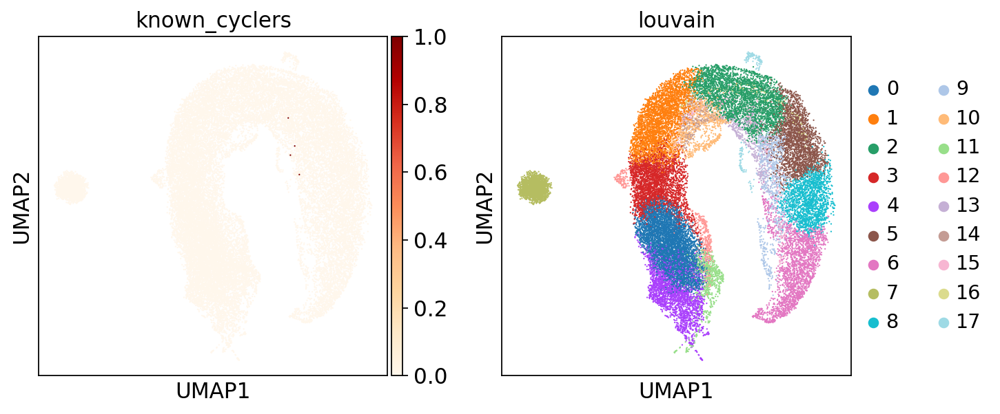

In [100]:
# Cluster GENES into subgroups using louvain
sc.tl.louvain(cellcycle_adata, resolution=1.0)
# Scatter plot in UMAP basis
sc.pl.umap(cellcycle_adata,color=['known_cyclers',
                                  'louvain'],color_map='OrRd',save='_ccg_identification.pdf')

In [101]:
# Locate genes of interests' cluster
print(cellcycle_adata.obs.loc[['CDK1','MKI67','CCNB2','PCNA'],'louvain'])


CDK1     13
MKI67    13
CCNB2     2
PCNA      9
Name: louvain, dtype: category
Categories (18, object): ['0', '1', '2', '3', ..., '14', '15', '16', '17']


In [102]:
adata_copy

AnnData object with n_obs × n_vars = 6338 × 29058
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'inv_troph_labels'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p'

So removing genes from cluster 13 by filtering the main matrix

In [103]:
# Add unstructured dict-like annotation for ccgs
adata_copy.uns['ccgs'] = list(cellcycle_adata.obs[(cellcycle_adata.obs['louvain']=='13')].index)
# Remove cc genes
adata_copy = adata_copy[:,[i not in adata_copy.uns['ccgs'] for i in adata_copy.var_names]]


/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)


In [104]:
adata_copy

View of AnnData object with n_obs × n_vars = 6338 × 28632
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'inv_troph_labels'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'ccgs'

In [105]:
# Assign cell cycle stage & scores
cell_cycle_genes = [x.strip() for x in open(file='/home/jovyan/notebooks/Vento_Lab/regev_lab_cell_cycle_genes_from_Luz_20200505.txt')]
s_genes = cell_cycle_genes[:43]
g2m_genes = cell_cycle_genes[43:]
s_genes = [x for x in s_genes if x in adata_copy.var_names]
g2m_genes = [x for x in g2m_genes if x in adata_copy.var_names]
sc.tl.score_genes_cell_cycle(adata_copy, s_genes=s_genes, g2m_genes=g2m_genes)

calculating cell cycle phase
computing score 'S_score'
Trying to set attribute `.obs` of view, copying.
    finished: added
    'S_score', score of gene set (adata.obs).
    231 total control genes are used. (0:00:00)
computing score 'G2M_score'
    finished: added
    'G2M_score', score of gene set (adata.obs).
    210 total control genes are used. (0:00:00)
-->     'phase', cell cycle phase (adata.obs)


In [106]:
adata_copy

AnnData object with n_obs × n_vars = 6338 × 28632
    obs: 'n_genes', 'donor', 'tissue_block', 'age', 'sample', 'percent_mito', 'n_counts', 'dataset', 'technique', 'scrublet_score', 'scrublet_cluster_score', 'bh_pval', 'batch', 'is_doublet', 'inv_troph_labels', 'S_score', 'G2M_score', 'phase'
    var: 'gene_ids-0', 'feature_types-0', 'genome-0', 'n_cells-0', 'gene_ids-1', 'feature_types-1', 'genome-1', 'n_cells-1', 'gene_ids-2', 'feature_types-2', 'genome-2', 'n_cells-2', 'gene_ids-3', 'feature_types-3', 'genome-3', 'n_cells-3', 'gene_ids-4', 'feature_types-4', 'genome-4', 'n_cells-4', 'gene_ids-5', 'feature_types-5', 'genome-5', 'n_cells-5', 'gene_ids-6', 'feature_types-6', 'genome-6', 'n_cells-6', 'gene_ids-7', 'feature_types-7', 'genome-7', 'n_cells-7'
    uns: 'log1p', 'ccgs'

In [107]:
# save for scVI
adata_copy.var.to_csv(save_path + 'genes_without_CC_assoc_genes_for_scVI_SN_and_multiome_invading_trophoblast_20211110.csv')

# to recalc scVI with informed n_latent, let's see how many PCs explain the trophoblast data


extracting highly variable genes
    finished (0:00:01)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


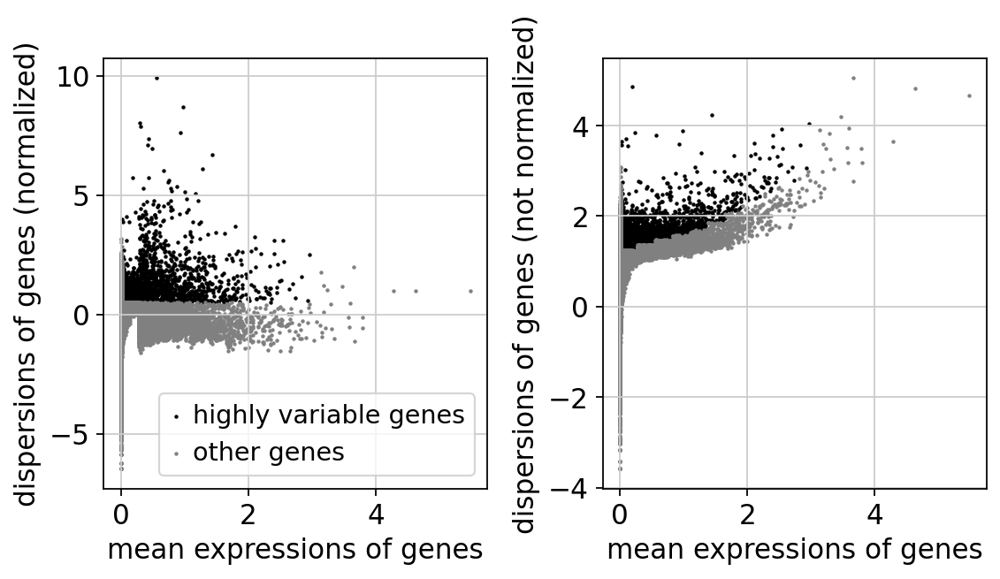

/opt/conda/lib/python3.8/site-packages/pandas/core/arrays/categorical.py:2487: FutureWarning: The `inplace` parameter in pandas.Categorical.remove_unused_categories is deprecated and will be removed in a future version.
  res = method(*args, **kwargs)
computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:05)


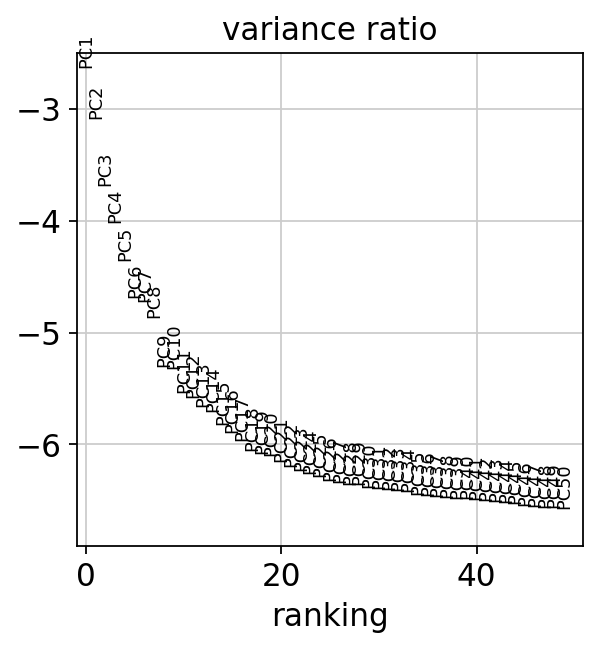

In [108]:
sc.pp.highly_variable_genes(adata_copy, min_mean=0.0125, max_mean=3, min_disp=0.5)

sc.pl.highly_variable_genes(adata_copy)

adata_copy_hvg = adata_copy[:, adata_copy.var['highly_variable']]

sc.tl.pca(adata_copy_hvg, svd_solver='arpack',
         n_comps=50)

sc.pl.pca_variance_ratio(adata_copy_hvg, log=True, save=False,
                        n_pcs=50)

In [109]:
# using n_latent = 9 and 11

From here following to run scVI in: `/nfs/team292/aa22/scVI_related/202111_upd_in_vivo_analysis/donor_P13_analysis/scVI_integration_SN_and_multiome_trophoblast.ipynb`